<a href="https://colab.research.google.com/github/FelixDeMan/DLVU/blob/master/beautiful_plots_with_whole_brain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive




Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 24.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
Cloning into 'pycortex'...
remote: Enumerating objects: 23882, done.
remote: Counting objects: 100% (2286/2286), done.
remote: Compressing objects: 100% (778/778), done.
remote: Total 23882 (delta 1529), reused 2152 (delta 1449), pack-reused 21596
Receiving objects: 100% (23882/23882), 476.15 MiB | 33.93 MiB/s, done.
Resolving deltas: 100% (18211/18211), done.
Generating a flatmap cache
Failed to get connection
** (inkscape:3342): CRITICAL **: 14:10:42.663: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3342): CRITICAL **: 14:10:42.663: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3342): CRITICAL **: 14:10:42.663: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
(118584, 120)


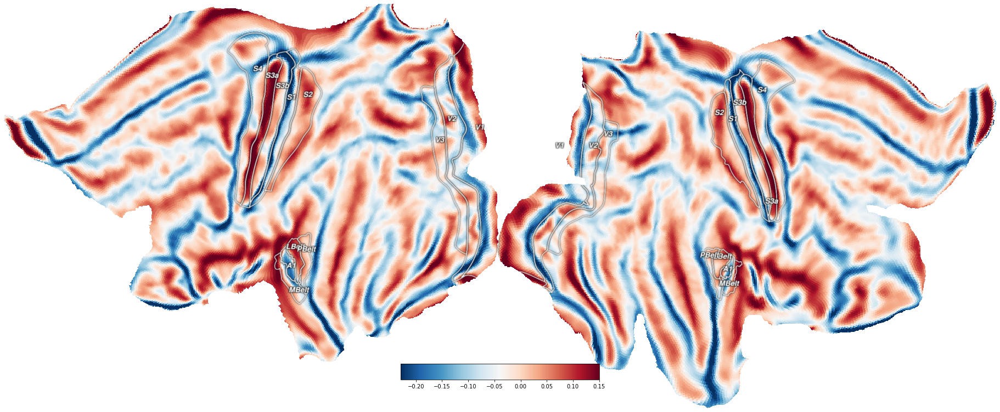

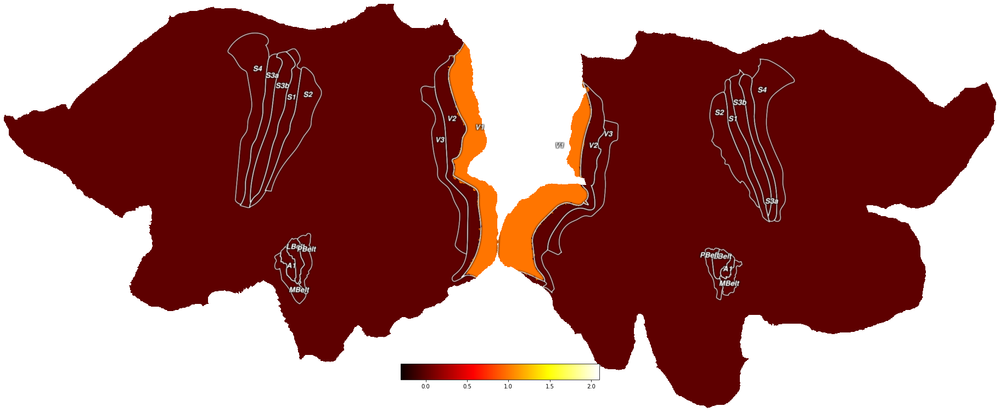

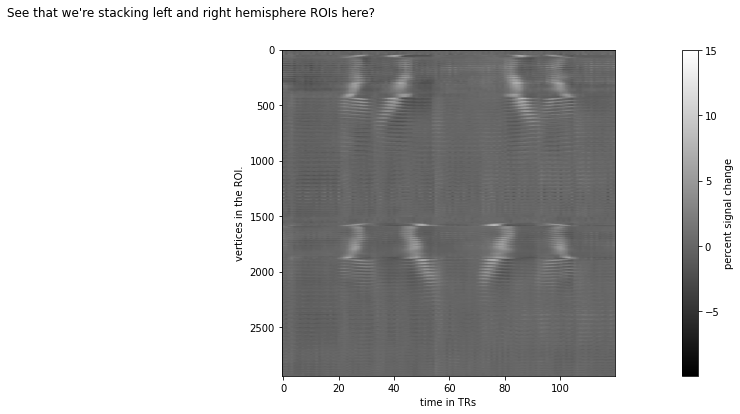

In [2]:
#install all stuff
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 


import cortex as cx
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);
#thickness type
#data 
tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
          for hemi in ['L', 'R']]))
 # and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));


roi_boolean_mask = atlas_data_both_hemis == 1

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    print("Already psc'd")
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");


roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

roi_low_level_Visual = {
  # low-level visual:
  'V1': 1, 'V2': 4, 'V3': 5,
}

VISUALIZATION

#  Percentage Signal Change & HIGH PASS FILTERING

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: invalid value encountered in true_divide


Failed to get connection
** (inkscape:3368): CRITICAL **: 14:11:09.259: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3368): CRITICAL **: 14:11:09.259: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3368): CRITICAL **: 14:11:09.259: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3371): CRITICAL **: 14:11:12.649: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3371): CRITICAL **: 14:11:12.649: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3371): CRITICAL **: 14:11:12.649: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


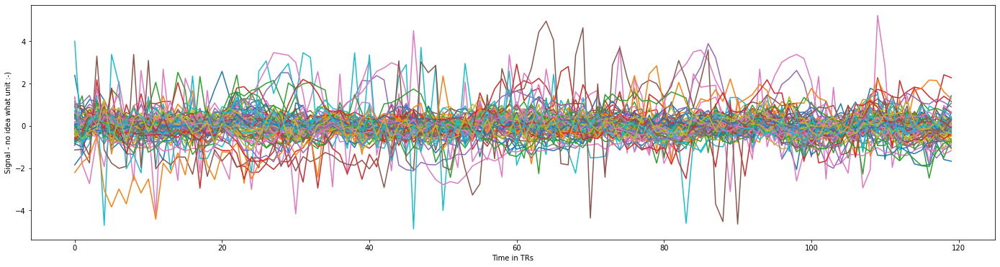

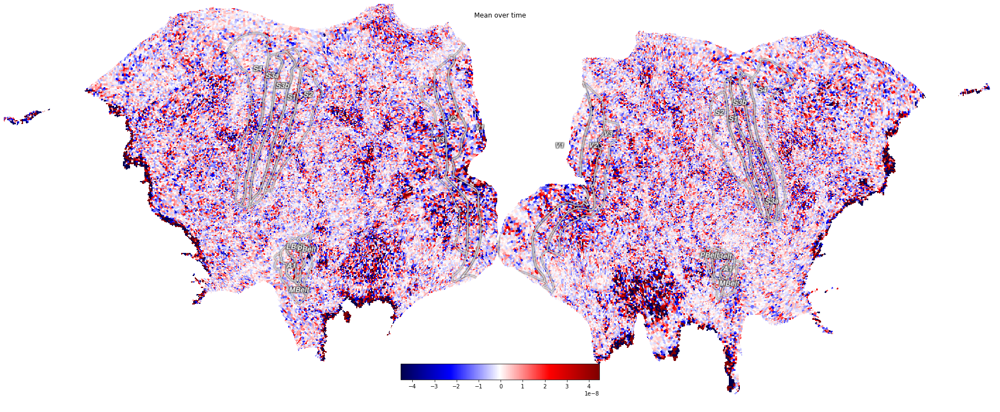

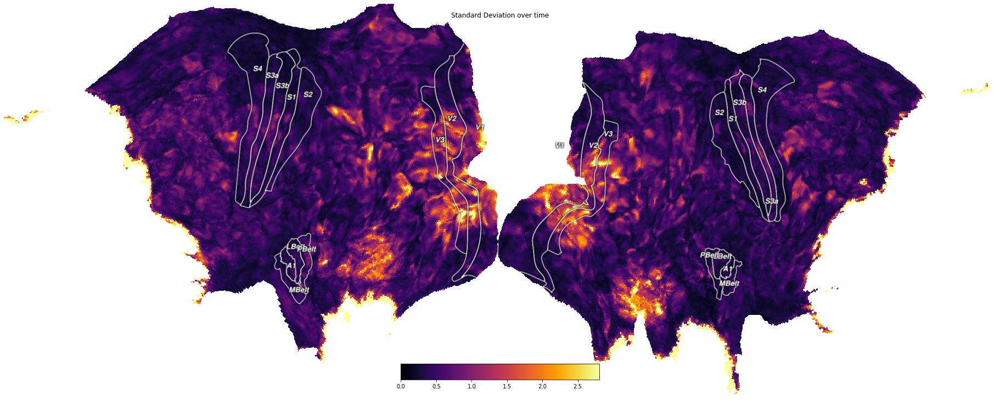

In [3]:
ts_normalized = psc(tseries_raw)

from scipy.ndimage import gaussian_filter

TR = 1.5
sigma_hp = 120 / (2 * TR) 

hpfiltered = np.empty_like(ts_normalized)
for i, sig in enumerate(ts_normalized):
  
  filter = gaussian_filter(sig, sigma_hp)
  hpfiltered[i,:] = sig - filter
random_vertices = np.random.choice(np.arange(hpfiltered.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(hpfiltered[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');
#PREPROCESSING PIC

# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(hpfiltered.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(hpfiltered.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

#Now our data has been normalized and high pass filtered thus we got rid of the slow drift and of the fact that different voxels have by definition higher level of oxygenation because of their position (normalization).

#Now our goal is applying the pRF computational model


Computational Model

/usr/local/lib/python3.7/dist-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)


3375 grid_model_timecourses created!


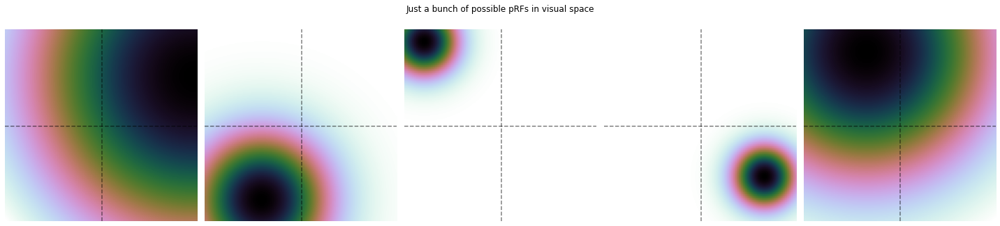

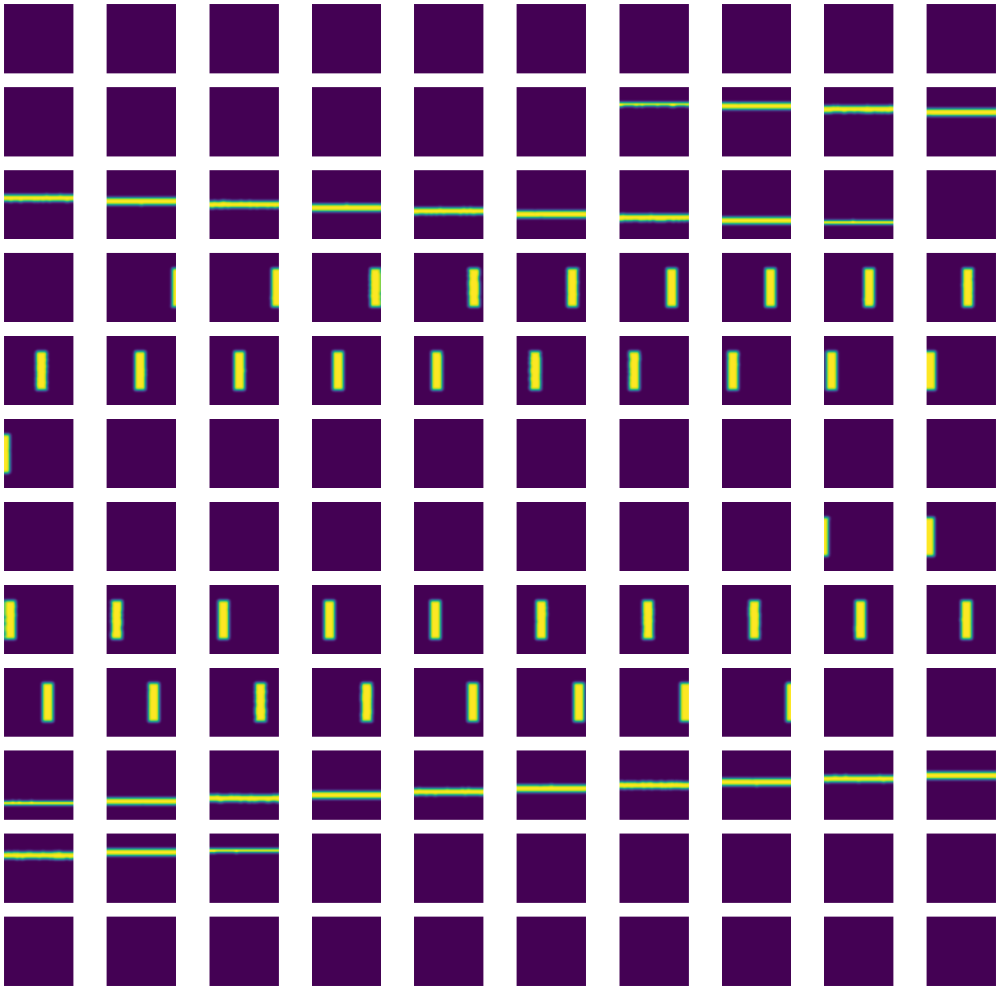

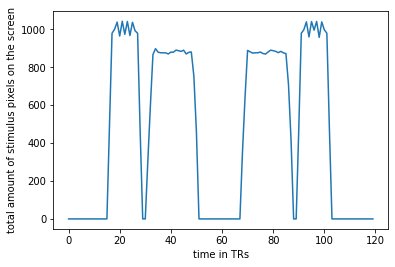

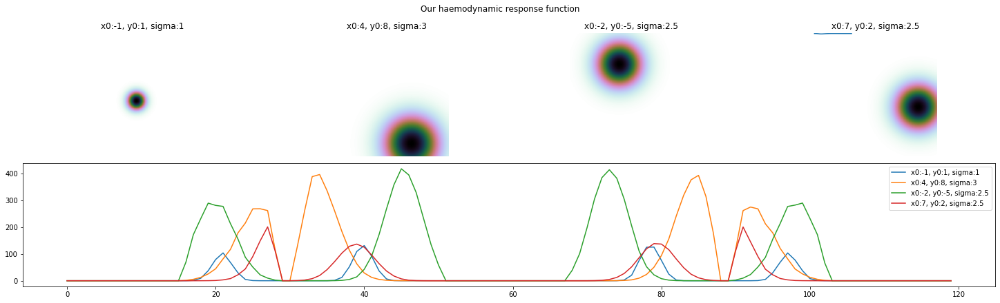

In [4]:
def gauss2D_iso_cart(x, y, mu=(0.0, 0.0), sigma=1.0, normalize_RFs=False):
    """gauss2D_iso_cart
    gauss2D_iso_cart takes two-dimensional arrays x and y, containing
    the x and y coordinates at which to evaluate the 2D isotropic gaussian 
    function, with a given sigma, and returns a 2D array of Z values.
    Parameters
    ----------
    x : numpy.ndarray, 2D or flattened by masking
        2D, containing x coordinates
    y : numpy.ndarray, 2D or flattened by masking
        2D, containing y coordinates
    mu : tuple, optional
        mean, 2D coordinates of mean/mode of gauss (the default is (0.0,0.0))
    sigma : float, optional
        standard deviation of gauss (the default is 1.0)
    Returns 
    -------
    numpy.ndarray, 2D or flattened by masking
        gaussian values evaluated at (x,y)
    """
    if normalize_RFs:
        return np.exp(-((x-mu[0])**2 + (y-mu[1])**2)/(2*sigma**2)) /(2*np.pi*sigma**2)
    else:
        return np.exp(-((x-mu[0])**2 + (y-mu[1])**2)/(2*sigma**2))


# set up the metrics of visual space
space_1D = np.linspace(-10,10,100,endpoint=True)
X, Y = np.meshgrid(space_1D, space_1D)

f, sps = plt.subplots(1,5,figsize=(20,5))
for i in range(5):
    x0, y0, sigma = -10+np.random.rand()*20, -10+np.random.rand()*20, 0.5 + np.random.exponential()*10
    sps[i].imshow(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False), cmap='cubehelix_r')
    sps[i].axvline(50, color='k', ls='--', alpha=0.5)
    sps[i].axhline(50, color='k', ls='--', alpha=0.5)
    sps[i].axis('off')
f.suptitle('Just a bunch of possible pRFs in visual space');
plt.tight_layout()



from scipy.io import loadmat
from scipy.ndimage import median_filter, gaussian_filter, binary_propagation
import matplotlib.animation as animation

dms = loadmat('/content/data/prf_mapper_59k/vis_design.mat')['stim'].T

# we have to do a bit of processing on the design matrix. 
# in essence this is a very slowly sampled movie of where the stimulus was on the screen
# you have one frame per TR, so that the analysis becomes easier. 

pixel_offset = int((dms.shape[1] - dms.shape[2]) / 2)
new_dms = np.zeros((dms.shape[0], dms.shape[1], dms.shape[1]))
for timepoint in range(dms.shape[0]):
    square_screen = np.zeros_like(new_dms[timepoint])
    square_screen[:,pixel_offset:pixel_offset+dms.shape[2]] = (dms[timepoint]!=0).astype(float)
    new_dms[timepoint,:,] = gaussian_filter(square_screen, 10).T

# if we then re-sample this design matrix to the same 100 x 100
# pixel space of our models above, our model space and stimulus space align. 

new_dms = new_dms[:,::5,::5]

# But what does it look like? Let's plot the design we're using!
# we could do this by creating a whole sequence of imshow plots,
# but this turns ugly pretty quickly. 

f, ss = plt.subplots(12,10, figsize=(30,30))
shp = 0
for i in range(12):
    for j in range(10):
        ss[i,j].imshow(new_dms[shp])
        ss[i,j].axis('off')
        shp += 1

# perhaps it's best to try to visualize this as it was in the actual experiment.
# but Google Colab doesn't do interactive plots....

# f, ax = plt.subplots(1, 1, figsize=(8,8))
# ax.axis('off')
# ims = []
# for i in range(new_dms.shape[0]):
#     if i == 0:
#         ax.imshow(new_dms[i])  # show an initial one first
#     im = ax.imshow(new_dms[i], animated=True)
#     ims.append([im])

# ani = animation.ArtistAnimation(f, ims, interval=50, blit=True,
#                                 repeat_delay=1000)

# ani
# by plotting the total amount of stimulus pixels on the screen over time
# we get a handle on the structure of the experiment

sos = new_dms.sum((1,2))
plt.figure()
plt.plot(sos)
plt.xlabel('time in TRs')
plt.ylabel('total amount of stimulus pixels on the screen');


# For clarity of the calculation, we make a vector out of the images 
# of both the stimulus and the pRF model by raveling them. 

def model_timecourse(model, stimulus):
    return np.dot(model.ravel(), stimulus.T.reshape((-1,stimulus.shape[0])))

# and we can plot these for a bunch of different pRFs
# and to make it nice, we use a gridspec. Remember this for your report :)
from matplotlib.gridspec import GridSpec

fig = plt.figure(constrained_layout=True, figsize=(20,6))
gs = GridSpec(2, 4, figure=fig)
ax_tc = fig.add_subplot(gs[1,:])

for x0,y0,sigma,i in zip([-1,4,-2,7], [1, 8, -5, 2], [1, 3, 2.5, 2.5], [0,1,2,3]):
    pRF = gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False)
    ax_prf = fig.add_subplot(gs[0,i])
    ax_prf.imshow(pRF, cmap='cubehelix_r')
    ax_prf.set_title(f'x0:{x0}, y0:{y0}, sigma:{sigma}')
    ax_prf.axis('off')
    ax_tc.plot(model_timecourse(pRF, new_dms), label=f'x0:{x0}, y0:{y0}, sigma:{sigma}')
ax_tc.legend();




from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf
tr = 1.5

hrf = _gamma_difference_hrf(tr=tr ,oversampling=1, onset=-tr/2)[np.newaxis,:]
plt.plot(np.arange(hrf.shape[-1])*tr, hrf.ravel())
plt.suptitle('Our haemodynamic response function')
plt.xlabel('Time [s]')

# then, we'll define the grid of possible pRF parameters that we want to try out.
# we have to be very careful in changing the amount of different grid points, 
# since computation time goes with the cube of this number.
n_grid_points = 15
xes, yes, sizes = np.linspace(-10,10,n_grid_points,endpoint=True), np.linspace(-10,10,n_grid_points,endpoint=True), np.linspace(0.25,10,n_grid_points,endpoint=True)
xgrid, ygrid, sgrid = np.meshgrid(xes, yes, sizes)
xgrid, ygrid, sgrid = xgrid.ravel(), ygrid.ravel(), sgrid.ravel()

# this will then allow us to create model time-courses for all of these. 
# this operation is rather computationally expensive, but for the grid fit, 
# it's the most time-consuming step (if we maintain a moderate number of grid points!)

grid_model_timecourses = np.array([model_timecourse(np.rot90(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False)), new_dms) for x0,y0,sigma in zip(xgrid, ygrid, sgrid)])
print(f'{grid_model_timecourses.shape[0]} grid_model_timecourses created!')

# and we perform the actual convolution in a fast way. 
grid_model_timecourses_conv = sp.signal.fftconvolve(grid_model_timecourses, hrf, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]



def rsq_for_model(data, model_tcs, return_yhat=False):
    """
    Parameters
    ----------
    data : numpy.ndarray
        1D or 2D, containing single time-course or multiple
    model_tcs : numpy.ndarray
        1D, containing single model time-course
    Returns 
    -------
    rsq : float or numpy.ndarray
        within-set rsq for this model's GLM fit, for all voxels in the data
    yhat : numpy.ndarray
        1D or 2D, model time-course for all voxels in the data

    """
    dm = np.vstack([np.ones(data.shape[-1]), model_tcs]).T
    betas = np.linalg.lstsq(dm, data.T)[0]
    yhat = np.dot(dm, betas).T
    rsq = 1-(data-yhat).var(-1)/data.var(-1)
    if return_yhat:
        return rsq, yhat
    else:
        return rsq


# once we have the best-fitting model for the different vertices/voxels, 
# we can look up what their visual field parameters are. This means that
# for each voxel/vertex, we now have an rsq and everything we need to 
# plot the voxel's pRF!
def get_x_y_s(rsqs):
  x_y_s_list = list() #result to be used

  rsqs_T = rsqs.T

  for i in range(len(rsqs_T)):
    if np.amax(rsqs_T[i]) < 0.15:
      # x_y_s_i = [0., 0., 0.]
      x_y_s_i = [np.nan, np.nan, np.nan]
    else:
      max_index = np.argmax(rsqs_T[i])
      x_y_s_i = [xgrid[max_index], ygrid[max_index], sgrid[max_index]]
    
    x_y_s_list.append(x_y_s_i)


  x_y_s = np.array(x_y_s_list)
  return x_y_s





In [5]:
# But working with polar coordinates is a bit hairy.
# The easiest way to go is through complex numbers. 
# you don't need to understand the following completely, 
# but you can use the code. It will also take arrays for 
# x0 and y0.

def angle(x0, y0):
    return np.angle(x0 + y0 * 1j)

def ecc(x0, y0):
    return np.abs(x0 + y0 * 1j)
# For clarity of the calculation, we make a vector out of the images 
# of both the stimulus and the pRF model by raveling them. 

def model_timecourse(model, stimulus):
    return np.dot(model.ravel(), stimulus.T.reshape((-1,stimulus.shape[0])))

def create_folder(dir):
  # helper function 
  if not os.path.exists(dir): os.mkdir(dir)

In [21]:
import pickle
def predicted_per_roi(roi, rsquareds = {}):
   # Calculate for full ROI the predicted signal, angle, ecc and prf size, stored in predicted
   # returns rsqs (so don't have to recalculate), data (predicted added to dummy data), and predicted (with predicted data per ROI)

  ROI_tcs = psc(hpfiltered[atlas_data_both_hemis == roi_index_dict[roi]])
 
  if roi not in rsquareds.keys():
    rsquareds[roi] = np.array([rsq_for_model(ROI_tcs, mtcs) for mtcs in grid_model_timecourses_conv])
  
  x_y_s = get_x_y_s(rsquareds[roi])
  
  predicted={
    "signal": [],
    "angle": [],
    "ecc": [],
    "prf_size": []
  }

  for i in range(x_y_s.shape[0]):
    #def gauss2D_iso_cart(x, y, mu=(0.0, 0.0), sigma=1.0, normalize_RFs=False):
    
    pRF = gauss2D_iso_cart(x = X,y = Y, mu =(x_y_s[i][0], x_y_s[i][1]), sigma =x_y_s[i][2], normalize_RFs=False)
  
    predicted["signal"].append(model_timecourse(pRF, new_dms))
    predicted["angle"].append(angle(x_y_s[i][0], x_y_s[i][1]))
    predicted["ecc"].append(ecc(x_y_s[i][0], x_y_s[i][1]))
    predicted["prf_size"].append( x_y_s[i][2])

  return predicted

def full_ROI(predicted):
  data = {}
  predict_signal = np.zeros_like(hpfiltered)
  predict_angle = np.zeros_like(hpfiltered[:,0])
  predict_ecc = np.zeros_like(hpfiltered[:,0])
  predict_prf_size = np.zeros_like(hpfiltered[:,0])
  
  for roi in predicted.keys():
    for key in predicted[roi].keys():
      if key == "signal":
        
        predict_signal[atlas_data_both_hemis == roi_index_dict[roi]] = predicted[roi][key] #predicted_np #predicted_signal, predicted_a
        data[key]= predict_signal

      if key == "angle":
        predict_angle[atlas_data_both_hemis == roi_index_dict[roi]] = predicted[roi][key] #predicted_np #predicted_signal, predicted_a
        data[key] = predict_angle

      if key == "ecc":
        predict_ecc[atlas_data_both_hemis == roi_index_dict[roi]] = predicted[roi][key] #predicted_np #predicted_signal, predicted_a
        data[key] = predict_ecc
      
      if key == "prf_size":
        predict_prf_size[atlas_data_both_hemis == roi_index_dict[roi]] = predicted[roi][key] #predicted_np #predicted_signal, predicted_a
        data[key] = predict_prf_size
      
  return data

def plot_flatmap(data):
    for key in data.keys():
      if key == "signal":
        predicted_vert = cx.Vertex(np.mean(data[key], axis = 1), subject='hcp_999999', cmap = "J4")
        p = None
        p = cx.quickshow(predicted_vert, title = "Predicted %s" %key)
        p.suptitle("Predicted mean signal")
      if key =="angle":
        predicted_angle = cx.Vertex(data[key], subject='hcp_999999',cmap= "twilight"  )
        p = None
        
        p = cx.quickshow(predicted_angle,  title = "Predicted %s" %key)
        
        p.suptitle("Predicted angle")
      if key =="ecc":
        predicted_ecc = cx.Vertex(data[key], subject='hcp_999999', , cmap = "J4")
        p = None
        p = cx.quickshow(predicted_ecc, title = "Predicted %s" %key)
        p.suptitle("Predicted eccentricity")
      if key =="prf_size":
        p = None
        predicted_prf_size = cx.Vertex(data[key], subject='hcp_999999', , cmap = "J4")
        p = cx.quickshow(predicted_prf_size, title = "Predicted %s" %key)
        p.suptitle("Predicted PRF size")


def merge_ROI(rsquareds={}):
  predicted_values = {} 
  for roi in roi_index_dict.keys():
    predicted_values[roi] = predicted_per_roi(roi, rsquareds)
    filename = "%s_predicted.pkl" %roi
    dir = "/gdrive/MyDrive/prf/"
    filedir = dir + filename
    create_folder(dir)

    with open(filedir, 'ab') as f:
      pickle.dump(predicted_values[roi], f)
        
#with open('saved_dictionary.pkl', 'rb') as f:
#    loaded_dict = pickle.load(f)
  

  
  #data_values = full_ROI(predicted_values) 
  #plot_flatmap(data_values)
  #return data_values


In [ ]:
data_values_roi = merge_ROI()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


KeyboardInterrupt: ignored

dict_keys(['CS1_4', 'CS2_3a', 'CS3_3b', 'CS4_1', 'CS5_2', 'A1', 'PBelt', 'MBelt', 'LBelt', '52', 'RI', 'V1', 'V2', 'V3', 'V3A', 'V3B', 'IPS1', 'LIPv', 'LIPd', 'VIP', 'FEF', 'MST', 'MT', 'LO1', 'LO2', 'LO3'])
Failed to get connection
** (inkscape:3752): CRITICAL **: 14:34:01.907: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3752): CRITICAL **: 14:34:01.907: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3752): CRITICAL **: 14:34:01.907: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3755): CRITICAL **: 14:34:03.246: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3755): CRITICAL **: 14:34:03.246: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3755): CRITICAL **: 14:34:03.247: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3758): CRITICAL **

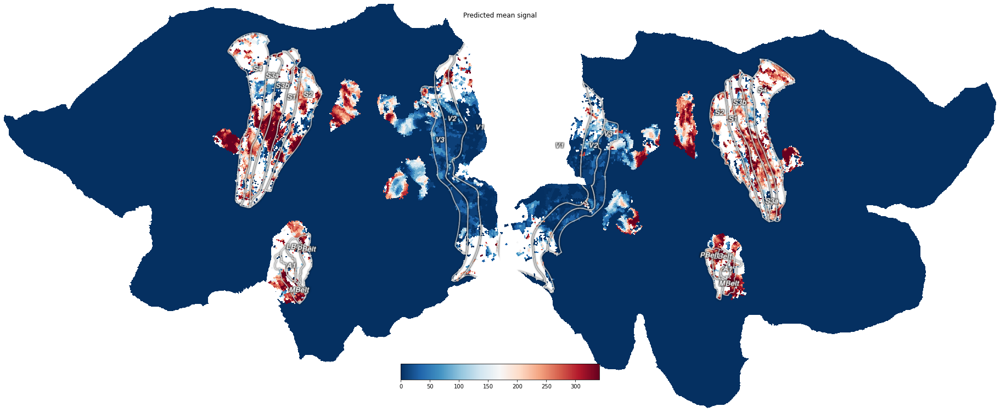

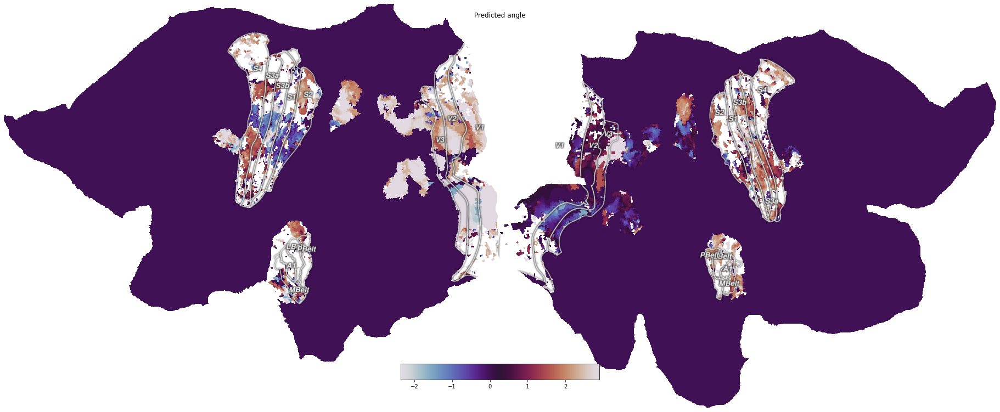

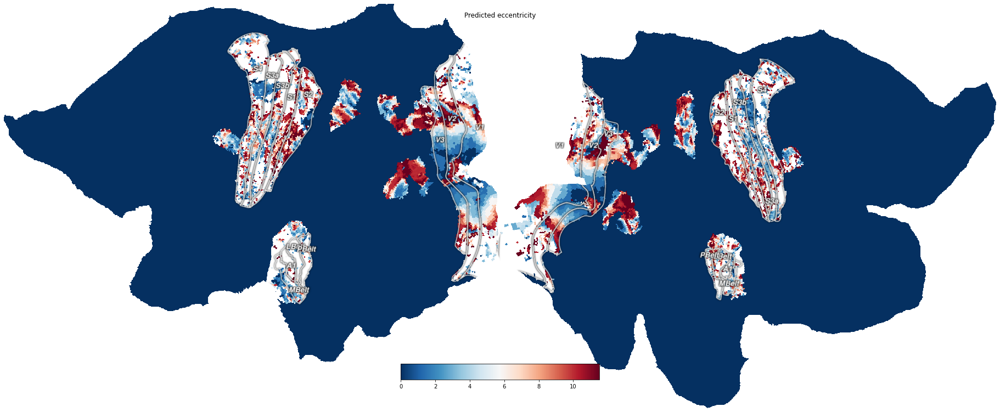

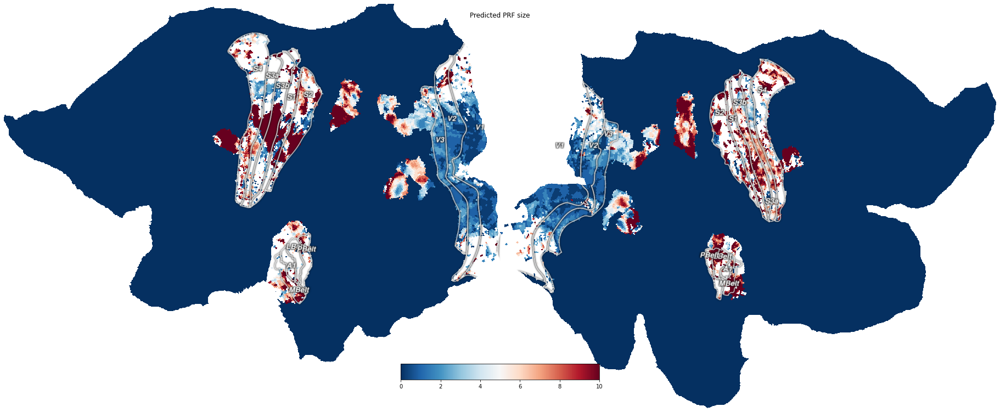

In [22]:
predicted = {}
basic_visual_regions = {}

def plot_saved_data():
  for roi in roi_index_dict.keys():
    filename = '%s_predicted.pkl'%roi
    dir = "/gdrive/MyDrive/prf/"
    filedir = dir + filename

    if not os.path.exists(dir + filename):
      print("File %s does not exist" %f)
      continue

    with open(filedir, 'rb') as f:
      predicted[roi] = pickle.load(f)
      if roi in roi_low_level_Visual.keys():
        basic_visual_regions[roi] = predicted[roi]

  print(predicted.keys())

  return full_ROI(predicted)

data_full_ROI = plot_saved_data()
plot_flatmap(data_full_ROI)

In [26]:
def predicted_whole_brain(rsquareds = {}):
   # Calculate for full ROI the predicted signal, angle, ecc and prf size, stored in predicted
   # returns rsqs (so don't have to recalculate), data (predicted added to dummy data), and predicted (with predicted data per ROI)

  ROI_tcs = psc(hpfiltered)
 
  if rsquareds == {}:
    rsquareds = np.array([rsq_for_model(ROI_tcs, mtcs) for mtcs in grid_model_timecourses_conv])
  
  x_y_s = get_x_y_s(rsquareds)
  
  predicted={
    "signal": [],
    "angle": [],
    "ecc": [],
    "prf_size": []
  }

  for i in range(x_y_s.shape[0]):
    #def gauss2D_iso_cart(x, y, mu=(0.0, 0.0), sigma=1.0, normalize_RFs=False):
    
    pRF = gauss2D_iso_cart(x = X,y = Y, mu =(x_y_s[i][0], x_y_s[i][1]), sigma =x_y_s[i][2], normalize_RFs=False)
  
    predicted["signal"].append(model_timecourse(pRF, new_dms))
    predicted["angle"].append(angle(x_y_s[i][0], x_y_s[i][1]))
    predicted["ecc"].append(ecc(x_y_s[i][0], x_y_s[i][1]))
    predicted["prf_size"].append( x_y_s[i][2])

  return predicted, rsquareds
whole_brain_pred, whole_brain_r2 = predicted_whole_brain()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


In [45]:


filename = "whole_brain_pred.pkl"
dir = "/gdrive/MyDrive/prf/"
filedir = dir + filename
create_folder(dir)
with open(filedir, 'ab') as f:
  pickle.dump(whole_brain_pred, f)

Failed to get connection
** (inkscape:5274): CRITICAL **: 17:08:26.885: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:5274): CRITICAL **: 17:08:26.888: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:5274): CRITICAL **: 17:08:26.888: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


AttributeError: ignored

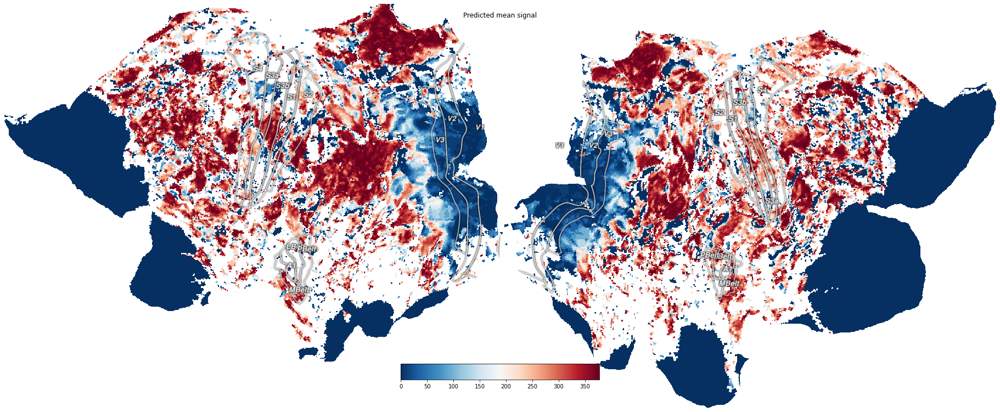

In [29]:
plot_flatmap(whole_brain_pred)



In [32]:
filename = "whole_brain_r2.pkl"
dir = "/gdrive/MyDrive/prf/"
filedir = dir + filename
create_folder(dir)

with open(filedir, 'ab') as f:
  pickle.dump(whole_brain_r2, f)

(3375, 118584)
(118584,)
Failed to get connection
** (inkscape:5353): CRITICAL **: 17:14:02.320: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:5353): CRITICAL **: 17:14:02.320: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:5353): CRITICAL **: 17:14:02.320: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


Text(0.5, 0.98, 'R^2 on whole brain')

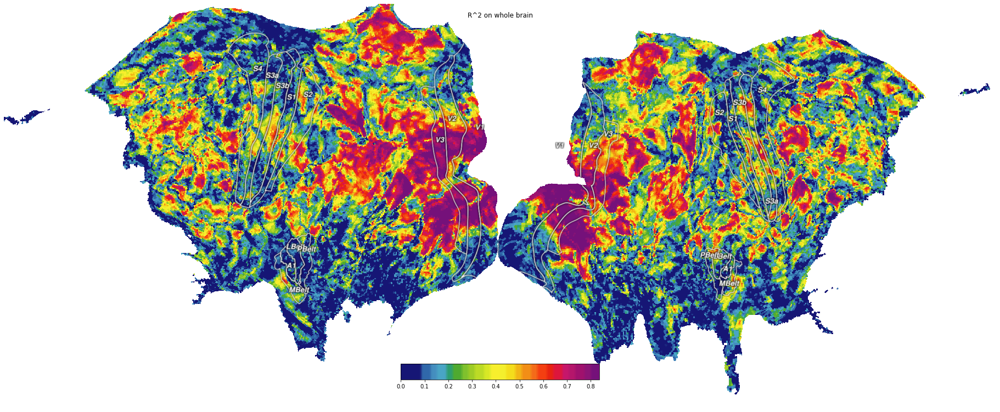

In [38]:
print(whole_brain_r2.shape)
maxed_r = np.max(whole_brain_r2, axis = 0)
print(maxed_r.shape)
predicted_angle = cx.Vertex(maxed_r, subject='hcp_999999',cmap= "J4" )
p = None
        
p = cx.quickshow(predicted_angle)
        
p.suptitle("R^2 on whole brain")

Failed to get connection
** (inkscape:5434): CRITICAL **: 17:19:41.449: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:5434): CRITICAL **: 17:19:41.449: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:5434): CRITICAL **: 17:19:41.449: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


Text(0.5, 0.98, 'R^2 on whole brain')

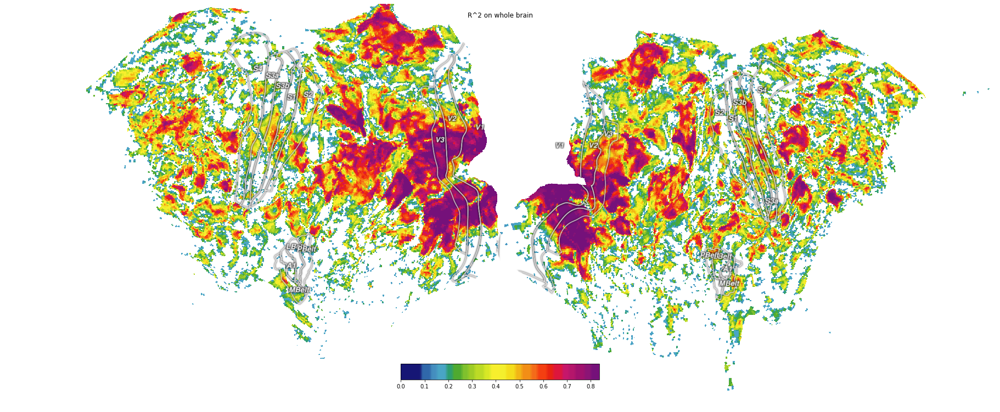

In [44]:
#best_fitting_models = np.array([np.argmax(rsqs) if rsqs.max()>0.15 else np.nan for rsqs in rsqses])
r2nan = np.array([i if i > 0.15 else np.nan for i in maxed_r])
predicted_angle = cx.Vertex(r2nan, subject='hcp_999999',cmap= "J4" )
p = None
        
p = cx.quickshow(predicted_angle)
        
p.suptitle("R^2 on whole brain")

In [43]:
maxed_r[maxed_r > 0.15]

array([0.52273006, 0.42202387, 0.42880895, ..., 0.2979332 , 0.34912685,
       0.16811393])

dict_keys(['V1', 'V2', 'V3'])
V1 [ 4.51753951  0.          1.42857143 ...  3.19438282  2.02030509
 12.2890361 ] [7.91071429 5.125      5.125      ... 1.64285714 0.94642857 0.25      ]
0.10056118499240214 1.0671667893729202
V2 [ 5.15078754  1.42857143  4.04061018 ... 13.1707778  10.87967587
 10.87967587] [6.51785714 3.73214286 5.82142857 ... 9.30357143 0.94642857 0.25      ]
0.1346134243291392 1.26168131963775
V3 [1.42857143 2.02030509 1.42857143 ... 1.42857143 1.42857143 2.02030509] [3.03571429 7.91071429 7.21428571 ... 2.33928571 0.94642857 3.03571429]
0.07759662383706804 1.5769596798928034


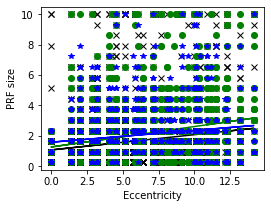

In [23]:
################################################
# Plot the relationship between eccentricity and 
# pRF size in visual field maps V1–V3
################################################
def plot_scatterplots(data):

  #create basic scatterplot
  plt.figure(figsize=(4, 3))
  ax = plt.axes()
  plot_choices = {'V1': 'kx', 'V2':  'go', 'V3': 'b*'}
  colors = {'V1': 'black', 'V2':  'green', 'V3': 'blue'}

  for roi in data.keys():
    ecc=np.array([x for x in data[roi]["ecc"] if not np.isnan(x)])
    prf_size=np.array([x for x in data[roi]["prf_size"] if not np.isnan(x)])
    ax.plot(ecc,prf_size, plot_choices[roi])
    print(roi, ecc, prf_size)

    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(ecc, prf_size, 1)
    print(m, b)

    #add linear regression line to scatterplot 
    ax.plot(ecc, m*ecc+b, color=colors[roi])

  ax.set_xlabel('Eccentricity')
  ax.set_ylabel('PRF size')

print(basic_visual_regions.keys())
plot_scatterplots(basic_visual_regions)